In [1]:
import sys, os
from pyprojroot import here

# spyder up to find the root
root = here(project_files=[".root"])

# append to path
sys.path.append(str(root))

In [2]:
import math
from pathlib import Path

import numpy as np
import matplotlib
import matplotlib.pyplot as plt

# Altitools
from alti_tools._src.data.ssh import download_ssh_toy
from alti_tools._src.transforms import spatial, temporal, psd as psd_transform
from alti_tools._src.viz import psd as psd_plots

import seaborn as sns
import corner

sns.set_context(context="talk", font_scale=0.7)

import xarray as xr
import pandas as pd
from scipy import ndimage
import holoviews as hv
import xrft
from dask.diagnostics import ProgressBar

import tqdm

%load_ext autoreload
%autoreload 2
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

In [29]:
# simulation dataset
# ref_ds = xr.open_dataset("/Volumes/EMANS_HDD/data/qg_sim/public/trial_dt/qgsim_simple_128x128_dt4000.nc")
# ref_ds = xr.open_dataset("/Volumes/EMANS_HDD/data/qg_sim/public/trial_dt/qgsim_simple_128x128_dt3600.nc").isel(steps=slice(0, 300, 1))
ref_ds = xr.open_dataset("/Volumes/EMANS_HDD/data/qg_sim/public/qgsim_forcing_128x128.nc")#.isel(steps=slice(400, 600))
# ref_ds = xr.open_dataset("/Volumes/EMANS_HDD/data/qg_sim/public/qgsim_forcing_512x512.nc")
ref_ds


<xarray.Dataset>
Dimensions:  (Nx: 512, Ny: 512, steps: 11)
Coordinates:
  * Nx       (Nx) float64 -3.142 -3.129 -3.117 -3.105 ... 3.105 3.117 3.129
  * Ny       (Ny) float64 -3.142 -3.129 -3.117 -3.105 ... 3.105 3.117 3.129
  * steps    (steps) float64 0.0 1.0 2.0 3.0 4.0 5.0 6.0 7.0 8.0 9.0 10.0
Data variables:
    p        (steps, Nx, Ny) float64 ...
    q        (steps, Nx, Ny) float64 ...
    u        (steps, Nx, Ny) float64 ...
    v        (steps, Nx, Ny) float64 ...
    q_obs    (steps, Nx, Ny) float64 ...
    p_obs    (steps, Nx, Ny) float64 ...
Attributes: (12/16)
    B:          0.0
    dt:         0.0004
    forcing:    wind_stress
    iters:      10000
    mu:         0.020053522829578813
    nu:         0.00016412040576263483
    ...         ...
    sgs:        constant
    step_size:  0.01227184630308513
    steps:      1000
    t0:         0.0
    x_minmax:   6.283185307179586
    y_minmax:   6.283185307179586

## Viz

### Stream Function

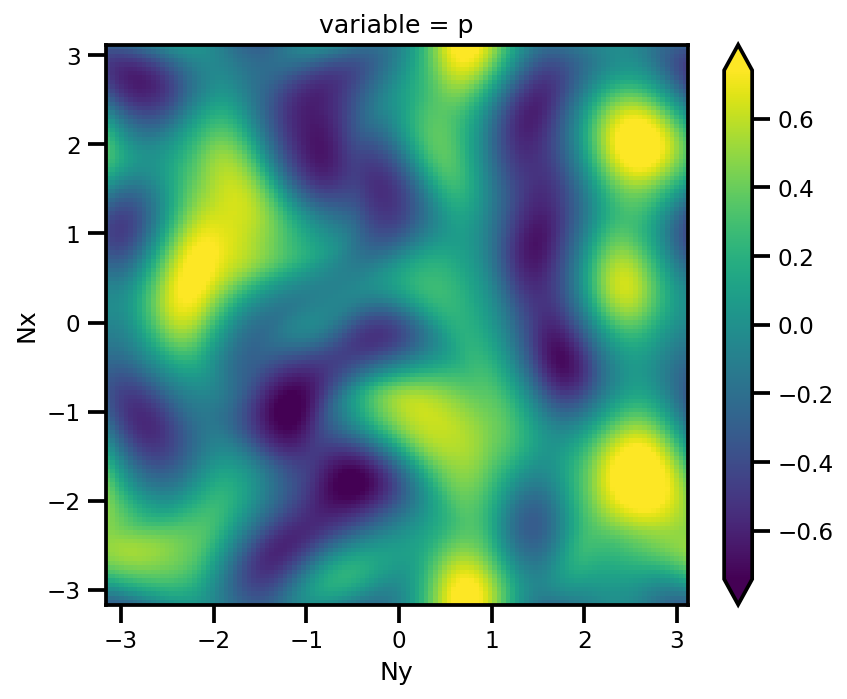

In [4]:
ref_ds[["p"]].to_array().isel(steps=400).plot.pcolormesh(col='variable', figsize=(6, 5), cmap="viridis", robust=True)


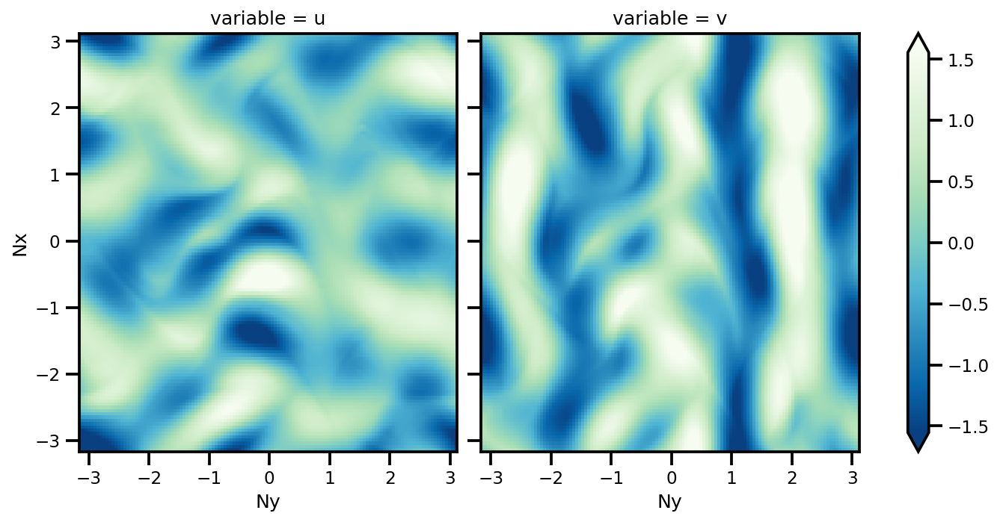

In [5]:
ref_ds[["u", "v"]].to_array().isel(steps=400).plot.pcolormesh(col='variable', figsize=(10, 5), cmap="GnBu_r", robust=True)


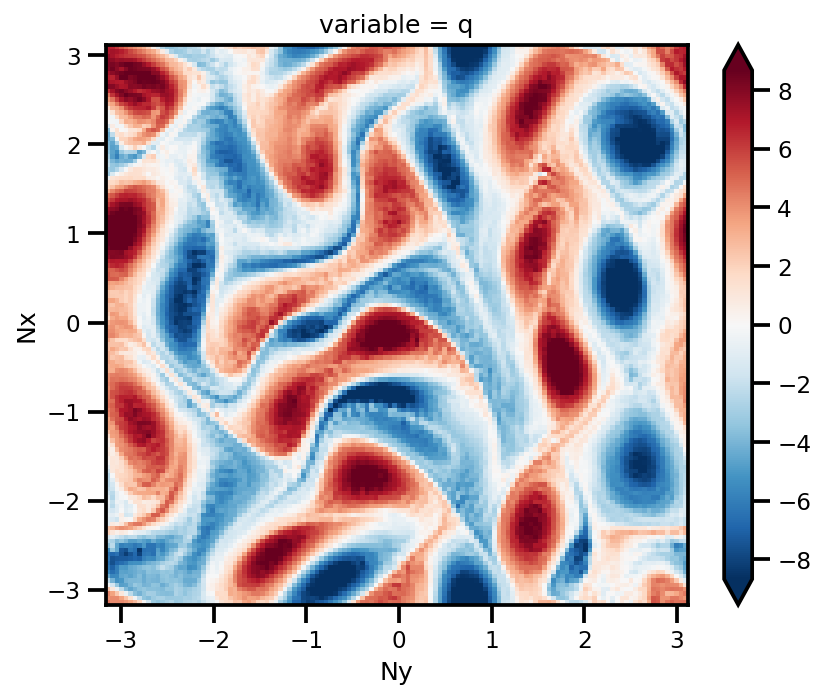

In [6]:
ref_ds[["q"]].to_array().isel(steps=400).plot.pcolormesh(col='variable', figsize=(6, 5), cmap="RdBu_r", robust=True)


### SSH Field Animation

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W

:Layout
   .HoloMap.P :HoloMap   [steps]
      :QuadMesh   [Nx,Ny]   (p)
   .HoloMap.U :HoloMap   [steps]
      :QuadMesh   [Nx,Ny]   (u)
   .HoloMap.V :HoloMap   [steps]
      :QuadMesh   [Nx,Ny]   (v)
   .HoloMap.Q :HoloMap   [steps]
      :QuadMesh   [Nx,Ny]   (q)
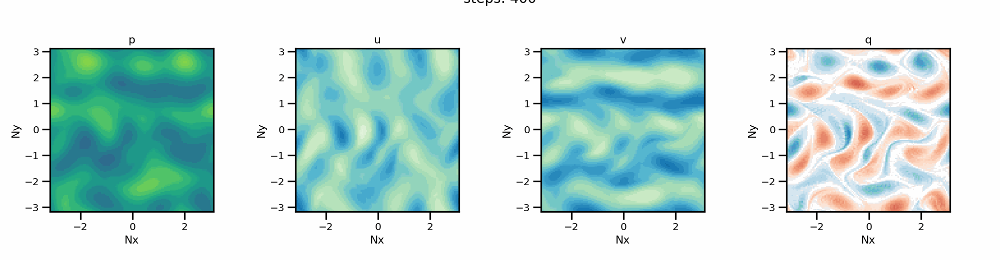

In [7]:
hv.extension('matplotlib')

# to_plot_ds = {"natl60": f(ref_ds.ssh), "oi": f(oi_ds.ssh_mod), "obs": f(obs_ds.ssh_mod)}
# to_plot_ds = [f(ref_ds.ssh), f(oi_ds.ssh_mod), f(obs_ds.ssh_mod)]
to_plot_ds = ref_ds.isel(steps=slice(400, 700, 10))
# clim = (
#     to_plot_ds[["natl60", "oi"]]
#     .to_array().pipe(lambda da: (da.quantile(0.005).item(), da.quantile(0.995).item()))
# )
# clim=None
cmaps = ["viridis", "GnBu_r", "GnBu_r", "RdBu_r"]

variables = ["p", "u", "v", "q"]
images = hv.Layout([
        hv.Dataset(to_plot_ds)
        .to(hv.QuadMesh, ['Nx', 'Ny'], v).relabel(v)
        .options(cmap=icmap)
        for v, icmap in zip(variables, cmaps)
]).cols(4).opts(sublabel_format="")

hv.output(images, holomap='gif', fps=2, dpi=125)

## Higher-Order Variables

* Kinetic Energy
* Enstrophy

In [8]:
# kinetic energy
ref_ds["ke"] = 0.5 * (ref_ds["u"]**2 + ref_ds["v"]**2)
# enstrophy
ref_ds["enstrophy"] = 0.5 * ref_ds["q"]**2

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W

:Layout
   .HoloMap.P  :HoloMap   [steps]
      :QuadMesh   [Nx,Ny]   (p)
   .HoloMap.Ke :HoloMap   [steps]
      :QuadMesh   [Nx,Ny]   (ke)
   .HoloMap.Q  :HoloMap   [steps]
      :QuadMesh   [Nx,Ny]   (q)
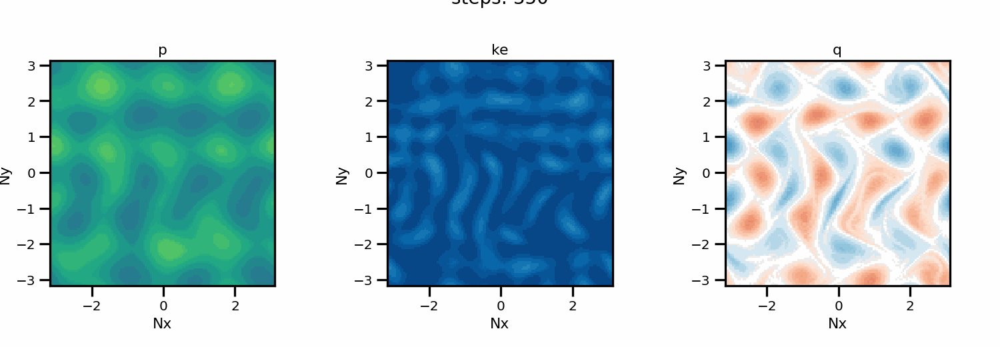

In [9]:
hv.extension('matplotlib')

# to_plot_ds = {"natl60": f(ref_ds.ssh), "oi": f(oi_ds.ssh_mod), "obs": f(obs_ds.ssh_mod)}
# to_plot_ds = [f(ref_ds.ssh), f(oi_ds.ssh_mod), f(obs_ds.ssh_mod)]
to_plot_ds = ref_ds.isel(steps=slice(350, 700, 10))
# clim = (
#     to_plot_ds[["natl60", "oi"]]
#     .to_array().pipe(lambda da: (da.quantile(0.005).item(), da.quantile(0.995).item()))
# )
# clim=None
cmaps = ["viridis", "GnBu_r", "RdBu_r"]
variables = ["p", "ke", "q"]
images = hv.Layout([
        hv.Dataset(to_plot_ds)
        .to(hv.QuadMesh, ['Nx', 'Ny'], v).relabel(v)
        .options(cmap=icmap)
        for v, icmap in zip(variables, cmaps)
]).cols(3).opts(sublabel_format="")


hv.output(images, holomap='gif', fps=2, dpi=125)

In [10]:
# !pip install pymap3d

In [11]:
import pymap3d as pm

In [12]:
# x, y, z = pm.geodetic2enu(ds_var.coords["lat"], ds_var.coords["lon"], 0.0)

## Units


The original PDE is:

$$
\partial_t \nabla^2 \eta + \frac{g}{f}\det\boldsymbol{J}(\eta, \nabla^2 \eta) = 0
$$

where:
* $\eta$ - sea surface height, $m$
* $\xi := \frac{f}{g}\nabla^2\eta$ - relative vorticity (or $q$ in QG terms), $s^{-1}$
* $g$ - gravity, $ms^{-2}$
* $f$ - Coriolis forcing parameter, $s^{-1}$
* $\psi=\frac{g}{f}\eta$ - stream function (in QG terms), $m^2s^{-1}$

---

The *nondimensional* PDE is written as:

$$
\frac{1}{\mathtt{T}}\partial_{\hat{t}} \nabla^2 \hat{\eta}  +
\frac{g\mathtt{H}}{f\mathtt{L}^2}\det\boldsymbol{J}\left(\hat{\eta} , \nabla^2 \hat{\eta}  \right) = 0
$$


where:
* $\hat{\eta} = \frac{1}{H}\eta$
* $(\hat{x},\hat{y}) = \frac{1}{L} (x,y)$
* $\hat{t} = \frac{1}{T}t$

We will work with the following constants for the non-dimensionalized equation:


| Quantity         |   Units   | Symbol |
|:---------------- |:---------:|:------:|
| Length Scale     |    $m$    |   L    |
| Height           |    $m$    |   H    |
| Time             |    $s$    |   T    |
| Gravity          | $ms^{-2}$ |   g    |
| Coriolis Forcing | $s^{-1}$  |   f    | 

---

In [154]:
import math

f = 1e-4 #2 * omega * np.sin(ref_lat)
g = 9.81

# domain unit
distance_unit = 5040e3 / math.pi # 5,040 km
# time unit
# time_unit = convert_dist_height_2_time(height=height_unit, distance=distance_unit, g=g, f=f)
time_unit = 1.2e6
dt: float = 480. / time_unit
vel_unit: float = distance_unit / time_unit
pv_unit: float = 1/time_unit
stream_unit: float = distance_unit**2 / time_unit
factor = np.timedelta64(6, "h")

print(time_unit/60/60/24, " days")

13.888888888888888  days


In [165]:
# ds_var = ref_ds.copy()
ds_var = xr.open_dataset("/Volumes/EMANS_HDD/data/qg_sim/public/qgsim_forcing_128x128.nc")
ds_var = ds_var.rename({"Nx": "lon", "Ny": "lat", "steps": "time"})

# convert distance units, x = Lx'
ds_var.coords["lon"] = ds_var.coords["lon"] * distance_unit
ds_var.coords["lat"] = ds_var.coords["lat"] * distance_unit

# convert time units, t = Tt'
ds_var.coords["time"] = ds_var.coords["time"] * time_unit * dt
ds_var.coords["time"] = ds_var.coords["time"].astype('datetime64[s]') 

# subset regions of interest
ds_var = ds_var.isel(time=slice(400, 700))

# normalize coordinates
ds_var.coords["lon"] = ds_var.coords["lon"] - ds_var.coords["lon"][0]
ds_var.coords["lat"] = ds_var.coords["lat"] - ds_var.coords["lat"][0]
ds_var.coords["time"] = (ds_var.coords["time"] - ds_var.coords["time"][0]) / factor

# convert units

# velocities, u = Uu'
ds_var["u"] = ds_var["u"] * vel_unit
ds_var["v"] = ds_var["u"] * vel_unit

# stream function, p = Pp'
ds_var["p"] = ds_var["p"] * stream_unit

# potential vorticity, q = Qq'
ds_var["q"] = ds_var["q"] * pv_unit

# sea surface height, eta = (f/g) p
ds_var["ssh"] = ds_var["p"].copy() * (f / g)

# kinetic energy
ds_var["ke"] = 0.5 * (ds_var["u"]**2 + ds_var["v"]**2)
# enstrophy
ds_var["enstrophy"] = 0.5 * ds_var["q"]**2

ds_var


<xarray.Dataset>
Dimensions:    (time: 300, lon: 128, lat: 128)
Coordinates:
  * lon        (lon) float64 0.0 7.875e+04 1.575e+05 ... 9.922e+06 1e+07
  * lat        (lat) float64 0.0 7.875e+04 1.575e+05 ... 9.922e+06 1e+07
  * time       (time) float64 0.0 0.02222 0.04444 0.06667 ... 6.6 6.622 6.644
Data variables:
    q          (time, lon, lat) float64 3.87e-06 3.443e-06 ... -2.277e-06
    p          (time, lon, lat) float64 -5.606e+05 -5.472e+05 ... 1.526e+06
    u          (time, lon, lat) float64 -1.924 -2.079 -2.214 ... 2.057 2.117 2.1
    v          (time, lon, lat) float64 -2.573 -2.779 -2.96 ... 2.75 2.83 2.807
    ssh        (time, lon, lat) float64 -5.715 -5.578 -5.341 ... 14.62 15.55
    ke         (time, lon, lat) float64 5.16 6.021 6.833 ... 5.895 6.246 6.146
    enstrophy  (time, lon, lat) float64 7.488e-12 5.928e-12 ... 2.592e-12
Attributes: (12/16)
    mu:         0.020053522829578813
    t0:         0.0
    B:          0.0
    nu:         0.00016412040576263483
    dt:         0.0004
    nv:         1
    ...         ...
    steps:      1000
    num_pts_x:  128
    num_pts_y:  128
    x_minmax:   6.283185307179586
    y_minmax:   6.283185307179586
    step_size:  0.04908738521234052

[Text(0.5, 0, 'Longitude [km]'), Text(0, 0.5, 'Latitude [km]')]

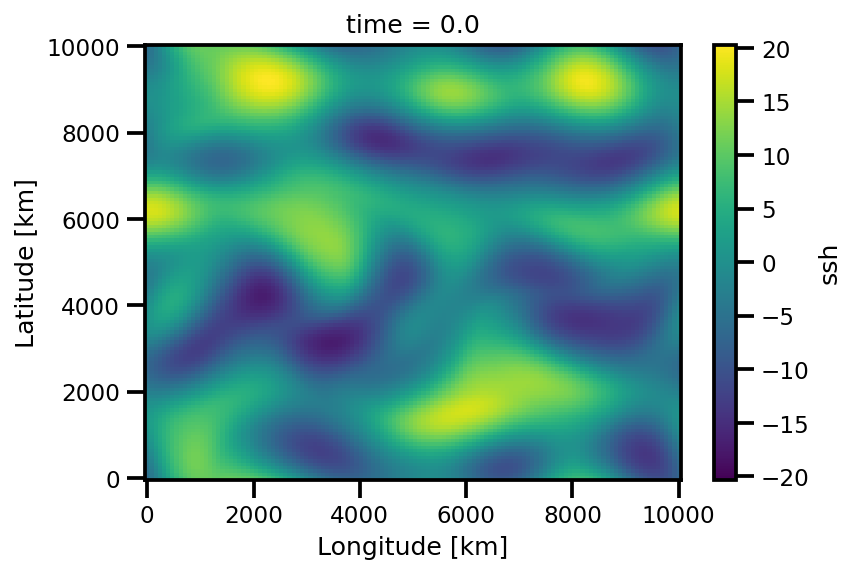

In [111]:


# get variable
plot_var = ds_var.copy()

# rescale lat/lon, m -> km
plot_var.coords["lon"] = plot_var.coords["lon"] * 1e-3
plot_var.coords["lat"] = plot_var.coords["lat"] * 1e-3

# plot
fig, ax = plt.subplots()
plot_var.ssh.isel(time=0).T.plot(cmap="viridis")

ax.set(xlabel="Longitude [km]", ylabel="Latitude [km]")

In [78]:
from pymap3d import enu2geodetic, geodetic2enu



In [122]:
from rasterio.warp import transform
from pyproj import CRS

In [103]:
# import urllib.request
# # Download the file from rasterio's repository
# url = 'https://github.com/mapbox/rasterio/raw/master/tests/data/RGB.byte.tif'
# urllib.request.urlretrieve(url, 'RGB.byte.tif')

# # Read the data
# da = xr.open_rasterio('RGB.byte.tif')

* Rasterio - [demo](https://rasterio.readthedocs.io/en/latest/topics/reproject.html)
* CMS Blog - [demo](https://climate-cms.org/posts/2021-10-01-pyproj.html)

In [131]:
crs = CRS.from_proj4("+proj=omerc +lat_0=23.5 +lon_0=147 +alpha=-54 +k=1 +x_0=0 +y_0=0 +gamma=0 +ellps=WGS84 +towgs84=0,0,0,0,0,0,0")
crs

<Bound CRS: +proj=omerc +lat_0=-36 +lonc=147 +alpha=-54 +k=1 + ...>
Name: unknown
Axis Info [cartesian]:
- E[east]: Easting (metre)
- N[north]: Northing (metre)
Area of Use:
- undefined
Coordinate Operation:
- name: Transformation from unknown to WGS84
- method: Position Vector transformation (geog2D domain)
Datum: Unknown based on WGS84 ellipsoid using towgs84=0,0,0,0,0,0,0
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich
Source CRS: unknown

In [220]:
# crs = CRS.from_proj4("+proj=omerc")
crs_origin = CRS.from_proj4("+proj=omerc +lat_0=25.5 +lon_0=105 +x_0=-8348961.80949552 +y_0=2875744.624352243 +gamma=0 +ellps=WGS84")
# crs_origin = CRS.from_epsg(3857)
# crs_origin = CRS.from_proj4("+proj=merc +lat_0=23.5 +lon_0=105 +x_0=-7357522.594618 +y_0=3854872.210478 +gamma=0 +a=6378137 +b=6378137 +towgs84=0,0,0,0,0,0,0 +units=m +no_defs")
crs_origin



<Derived Projected CRS: +proj=omerc +lat_0=25.5 +lon_0=105 +x_0=-8348961.8 ...>
Name: unknown
Axis Info [cartesian]:
- E[east]: Easting (metre)
- N[north]: Northing (metre)
Area of Use:
- undefined
Coordinate Operation:
- name: unknown
- method: Hotine Oblique Mercator (variant B)
Datum: Unknown based on WGS84 ellipsoid
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [221]:
crs_dest = CRS.from_epsg(4326)
# crs_dest = CRS("+proj=epsg +lat_0=23.0 +lon_0=105")
crs_dest


<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [162]:
# get variable
plot_var = ds_var.copy()
plot_var.coords["lon"].min(), plot_var.coords["lon"].max()

(<xarray.DataArray 'lon' ()>
 array(0.),
 <xarray.DataArray 'lon' ()>
 array(10001249.99999997))

In [176]:
min(lon)+(285-180), max(lon)+(285-180), 

(105.0, 194.84275735300332)

In [198]:
min(lat)+23, max(lat)+23

(23.0, 89.45051453817992)

ValueError: The input coordinate is not sorted in increasing order along axis 0. This can lead to unexpected results. Consider calling the `sortby` method on the input DataArray. To plot data with categorical axes, consider using the `heatmap` function from the `seaborn` statistical plotting library.

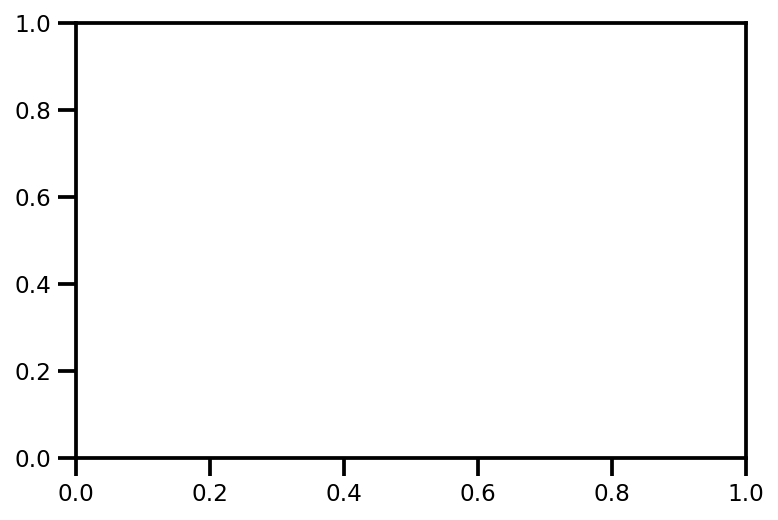

In [222]:
# get variable
plot_var = ds_var.copy()


# crs = CRS.from_proj4("+proj=latlon")
lon, lat = transform(
    # {'init': 'EPSG:3857', "lat_0": 23.5, "lon_0": 105.5}, # 3857
    # {'init': 'EPSG:4326', "lat_0": 23.0},
    crs_origin,
    crs_dest,
    plot_var.lon.data, plot_var.lat.data
)

# rescale lat/lon, m -> km
plot_var.coords["lon"] = np.array(lon) 
plot_var.coords["lat"] = np.array(lat)

# plot
fig, ax = plt.subplots()
plot_var.ssh.isel(time=0).T.plot(cmap="viridis")
ax.set(xlabel="Longitude [degrees]", ylabel="Latitude [degrees]")

In [114]:
np.array(lon).shape, np.array(lat).shape, plot_var.lon.values.shape

((128,), (128,), (128,))

In [117]:

# get variable
plot_var = ds_var.copy()


# rescale lat/lon, m -> km
plot_var.coords["lon"] = np.array(lon) * 1e-3
plot_var.coords["lat"] = np.array(lat) * 1e-3

# # coordinate transform, (x,y)->(lat,lon)   
# lat, lon, _ = enu2geodetic(
#     plot_var.coords["lon"], plot_var.coords["lat"], 0.0,
#     23.0, 285.0-180.0, 0.0
# )

# print(lat.min(), lat.max(), lon.min(), lon.max() )

# plot_var.coords["lon"] = (("x","y"), lon)
# plot_var.coords["lat"] = (("x","y"), lat)

# plot
fig, ax = plt.subplots()
plot_var.ssh.isel(time=0).T.plot(cmap="viridis")
ax.set(xlabel="Longitude [degrees]", ylabel="Latitude [degrees]")

[Text(0.5, 0, 'Longitude [degrees]'), Text(0, 0.5, 'Latitude [degrees]')]

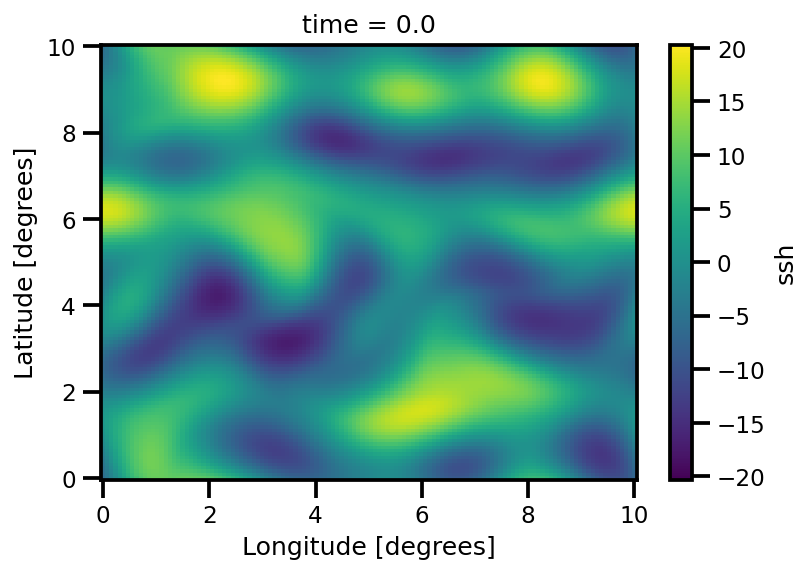

In [118]:
# plot
fig, ax = plt.subplots()
plot_var.ssh.isel(time=0).T.plot(cmap="viridis")
ax.set(xlabel="Longitude [degrees]", ylabel="Latitude [degrees]")

[Text(0.5, 0, 'Longitude [degrees]'), Text(0, 0.5, 'Latitude [degrees]')]

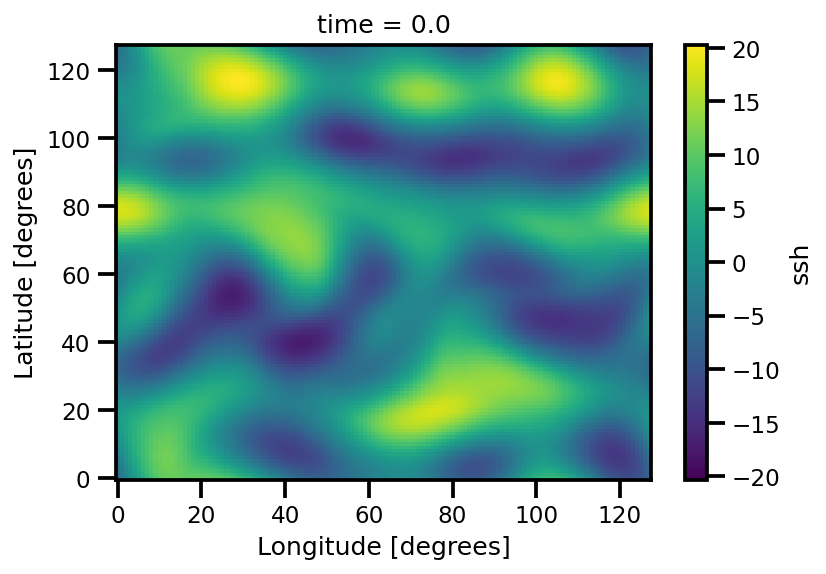

In [80]:



# get variable
plot_var = ds_var.copy()

# rescale lat/lon, m -> km
plot_var.coords["lon"] = plot_var.coords["lon"] * 1e-3
plot_var.coords["lat"] = plot_var.coords["lat"] * 1e-3

# coordinate transform, (x,y)->(lat,lon)  
lat, lon, _ = enu2geodetic(
    plot_var.lat, plot_var.lon, 0.0,
    23.0, 285.0-180.0, 0.0
)

plot_var.coords["lon"] = (("x","y"), lon)
plot_var.coords["lat"] = (("x","y"), lat)


# plot
fig, ax = plt.subplots()
plot_var.ssh.isel(time=0).T.plot(cmap="viridis")
ax.set(xlabel="Longitude [degrees]", ylabel="Latitude [degrees]")

In [15]:
# sea surface height
ds_psd_ssh = psd_transform.isotropic_power_spectrum_dask(ds_var.ssh)
# kinetic energy
ds_psd_ke = psd_transform.isotropic_power_spectrum_dask(ds_var.ke)
# enstropy
ds_psd_enstropy = psd_transform.isotropic_power_spectrum_dask(ds_var.enstrophy)

[########################################] | 100% Completed |  8.0s
[########################################] | 100% Completed |  9.4s
[########################################] | 100% Completed |  8.7s


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
/var/folders/k9/_v6ywhvj0nq36tpttd3j4mq80000gn/T/ipykernel_64968/2386571837.py:4: UserWarning: Matplotlib is currently using agg, which is a non-GUI backend, so cannot show the figure.
  plt.show()


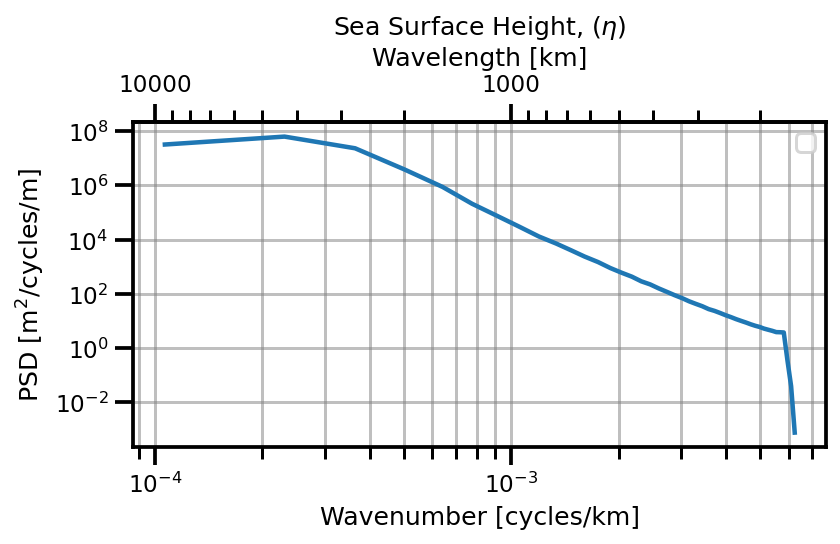

In [16]:
fig, ax = psd_plots.plot_psd(ds_psd_ssh, 1e3)
ax.set_title(r"Sea Surface Height, ($\eta$)")
plt.tight_layout()
plt.show()

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
/var/folders/k9/_v6ywhvj0nq36tpttd3j4mq80000gn/T/ipykernel_64968/2198888350.py:5: UserWarning: Matplotlib is currently using agg, which is a non-GUI backend, so cannot show the figure.
  plt.show()


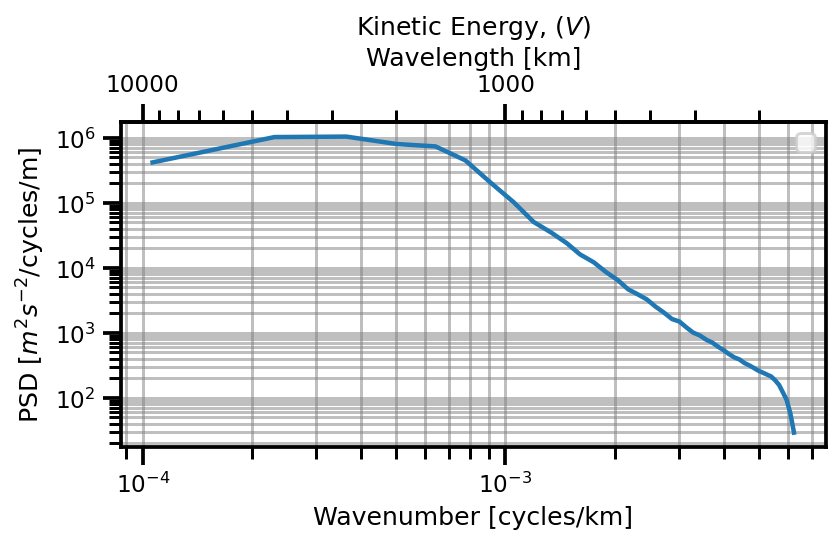

In [17]:
fig, ax = psd_plots.plot_psd(ds_psd_ke, 1e3)
ax.set_title(r"Kinetic Energy, ($V$)")
ax.set_ylabel(r"PSD [$m^2s^{-2}$/cycles/m]")
plt.tight_layout()
plt.show()

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
/var/folders/k9/_v6ywhvj0nq36tpttd3j4mq80000gn/T/ipykernel_64968/2590151875.py:5: UserWarning: Matplotlib is currently using agg, which is a non-GUI backend, so cannot show the figure.
  plt.show()


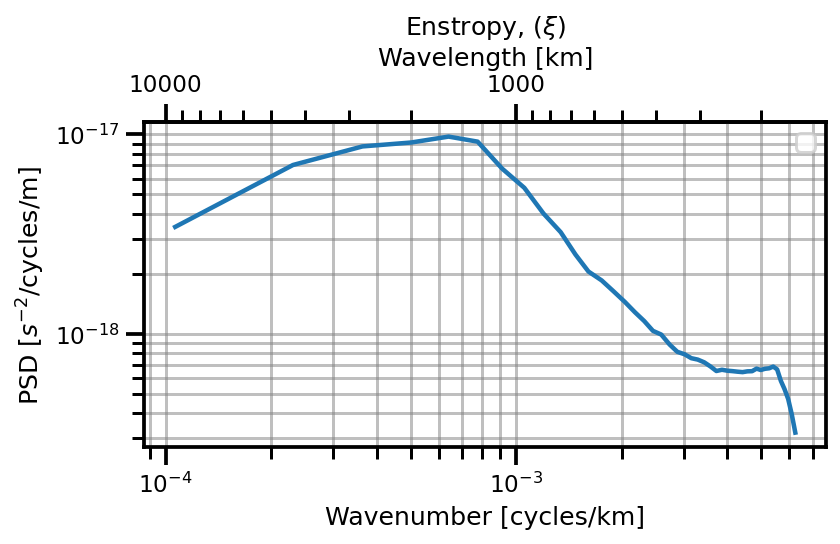

In [18]:
fig, ax = psd_plots.plot_psd(ds_psd_enstropy, 1e3)
ax.set_title(r"Enstropy, ($\xi$)")
ax.set_ylabel(r"PSD [$s^{-2}$/cycles/m]")
plt.tight_layout()
plt.show()

### Scale Analysis

We can do some scale analysis to determine how big the scales we can have when deciding the units. If we look at just the scaling for each of the terms in the non-dimensional equation, we get:

$$
\mathcal{O}\left(\frac{1}{T}\right) + \mathcal{O}\left(\frac{gH}{fL^2}\right) = 0
$$

and we can simplify this in terms of T, L and H respectively. For each of these, we are isolating the LHS of the equation. This gives us the following relationships:

$$
\begin{aligned}
T &\propto \frac{g}{f}\frac{L^2}{H} \\
L &\propto \sqrt{\frac{g}{f}HT} \\
H &\propto \frac{g}{f}\frac{L^2}{T} 
\end{aligned}
$$

Note: the typical scenario is solving for $T$ or $L$ because we generally have a good idea about $H$ and $T$ or $H$ and $L$.

In [19]:
def convert_dist_height_2_time(distance, height, g, f):

    return (f / g) * (distance ** 2 / height)

def convert_time_height_2_dist(time, height, g, f):
    return np.sqrt( (g / f) * (height * time) )

def convert_time_dist_2_height(distance, time, g, f):
    return (g / f) * (distance ** 2 / time)

def check_proportions(distance, time, height, g, f):
    return None



In [20]:
# height unit
unit_h = 0.2 # meters
# domain unit
unit_l = 100e3 # 100 km
# time unit
unit_t = convert_dist_height_2_time(height=unit_h, distance=unit_l, g=g, f=f)
print(unit_t, " seconds")
print(unit_t/60, " minutes")
print(unit_t/60/60, " hours")
print(unit_t/60/60/24, " days")

509683.99592252803  seconds
8494.733265375467  minutes
141.57888775625779  hours
5.899120323177407  days


In [21]:
import math

f = 1e-4 #2 * omega * np.sin(ref_lat)
g = 9.81

# domain unit
distance_unit = 100e3 / math.pi # 100 km
height_unit = 0.2 # m
# time unit
# time_unit = convert_dist_height_2_time(height=height_unit, distance=distance_unit, g=g, f=f)
time_unit = 60*60*24*6
dt: float = 60*60. / time_unit
vel_unit: float = distance_unit / time_unit
pv_unit: float = 1/time_unit
stream_unit: float = distance_unit**2 / time_unit
factor = np.timedelta64(6, "h")
print(time_unit, " seconds")
print(time_unit/60, " minutes")
print(time_unit/60/60, " hours")
print(time_unit/60/60/24, " days")
print(time_unit/60/60/24/30, " months")
print(time_unit/60/60/24/30/12, " years")

518400  seconds
8640.0  minutes
144.0  hours
6.0  days
0.2  months
0.016666666666666666  years


In [22]:
# ds_var = ref_ds.copy()
ds_var = xr.open_dataset("/Volumes/EMANS_HDD/data/qg_sim/public/qgsim_forcing_128x128.nc")
ds_var = ds_var.rename({"Nx": "lon", "Ny": "lat", "steps": "time"})

# convert distance units
ds_var.coords["lon"] = ds_var.coords["lon"] * distance_unit
ds_var.coords["lat"] = ds_var.coords["lat"] * distance_unit

# convert time units
ds_var.coords["time"] = ds_var.coords["time"] * time_unit * dt
ds_var.coords["time"] = ds_var.coords["time"].astype('datetime64[s]') 

# subset regions of interest
ds_var = ds_var.isel(time=slice(400, 700))

# normalize coordinates
ds_var.coords["lon"] = ds_var.coords["lon"] - ds_var.coords["lon"][0]
ds_var.coords["lat"] = ds_var.coords["lat"] - ds_var.coords["lat"][0]
ds_var.coords["time"] = (ds_var.coords["time"] - ds_var.coords["time"][0]) / factor

# convert units

# velocities
ds_var["u"] = ds_var["u"] * vel_unit
ds_var["v"] = ds_var["u"] * vel_unit

# sea surface height (hacky)
ds_var["ssh_scaled"] = ds_var["p"].copy() * height_unit

# stream function
ds_var["p"] = ds_var["p"] * stream_unit

# potential vorticity
ds_var["q"] = ds_var["q"] * pv_unit

# sea surface height (properly)
ds_var["ssh"] = ds_var["p"] * (f / g)
# kinetic energy
ds_var["ke"] = 0.5 * (ds_var["u"]**2 + ds_var["v"]**2)
# enstrophy
ds_var["enstrophy"] = 0.5 * ds_var["q"]**2

ds_var


<xarray.Dataset>
Dimensions:     (time: 300, lon: 128, lat: 128)
Coordinates:
  * lon         (lon) float64 0.0 1.562e+03 3.125e+03 ... 1.969e+05 1.984e+05
  * lat         (lat) float64 0.0 1.562e+03 3.125e+03 ... 1.969e+05 1.984e+05
  * time        (time) float64 0.0 0.1667 0.3333 0.5 ... 49.33 49.5 49.67 49.83
Data variables:
    q           (time, lon, lat) float64 8.958e-06 7.97e-06 ... -5.271e-06
    p           (time, lon, lat) float64 -510.9 -498.7 ... 1.307e+03 1.39e+03
    u           (time, lon, lat) float64 -0.08838 -0.09547 ... 0.09723 0.09645
    v           (time, lon, lat) float64 -0.005427 -0.005862 ... 0.005922
    ssh_scaled  (time, lon, lat) float64 -0.05228 -0.05103 ... 0.1337 0.1423
    ssh         (time, lon, lat) float64 -0.005208 -0.005083 ... 0.01332 0.01417
    ke          (time, lon, lat) float64 0.00392 0.004574 ... 0.004745 0.004669
    enstrophy   (time, lon, lat) float64 4.012e-11 3.176e-11 ... 1.389e-11
Attributes: (12/16)
    mu:         0.020053522829578813
    t0:         0.0
    B:          0.0
    nu:         0.00016412040576263483
    dt:         0.0004
    nv:         1
    ...         ...
    steps:      1000
    num_pts_x:  128
    num_pts_y:  128
    x_minmax:   6.283185307179586
    y_minmax:   6.283185307179586
    step_size:  0.04908738521234052

[Text(0.5, 0, 'Longitude [m]'), Text(0, 0.5, 'Latitude [m]')]

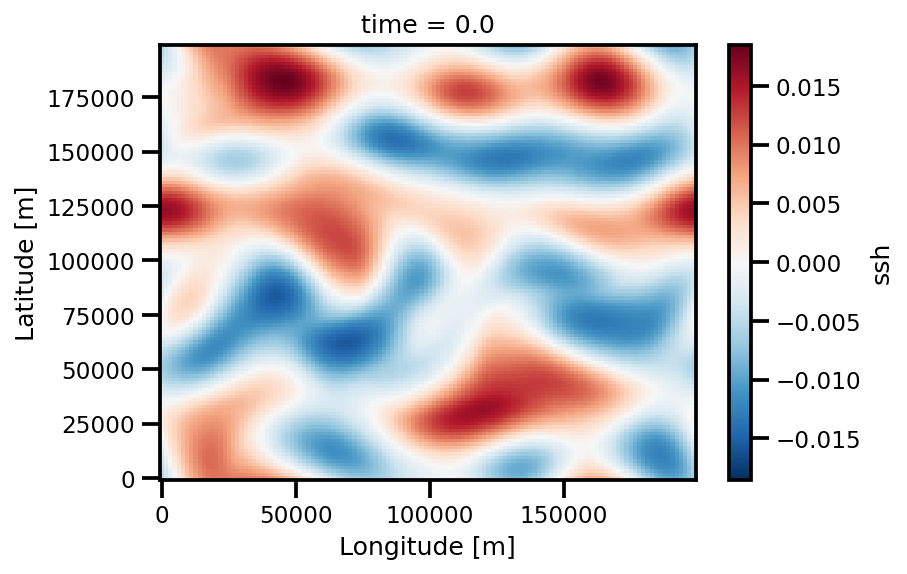

In [23]:
# sea surface height
ds_psd_ssh = psd_transform.isotropic_power_spectrum(ds_var.ssh)
ds_psd_ssh_scaled = psd_transform.isotropic_power_spectrum(ds_var.ssh_scaled)


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
/var/folders/k9/_v6ywhvj0nq36tpttd3j4mq80000gn/T/ipykernel_64968/2111648182.py:5: UserWarning: Matplotlib is currently using agg, which is a non-GUI backend, so cannot show the figure.
  plt.show()
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
/var/folders/k9/_v6ywhvj0nq36tpttd3j4mq80000gn/T/ipykernel_64968/2111648182.py:12: UserWarning: Matplotlib is currently using agg, which is a non-GUI backend, so cannot show the figure.
  plt.show()


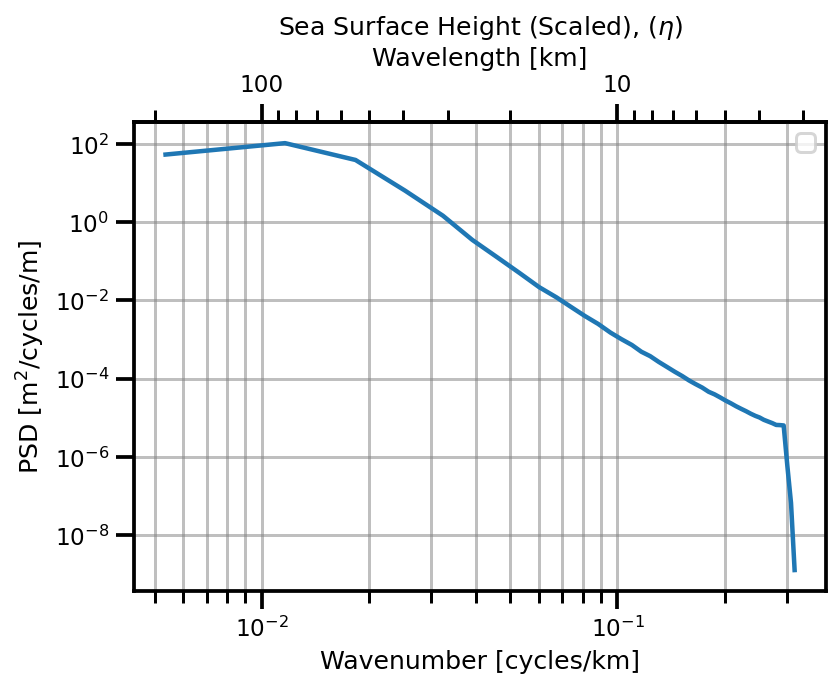

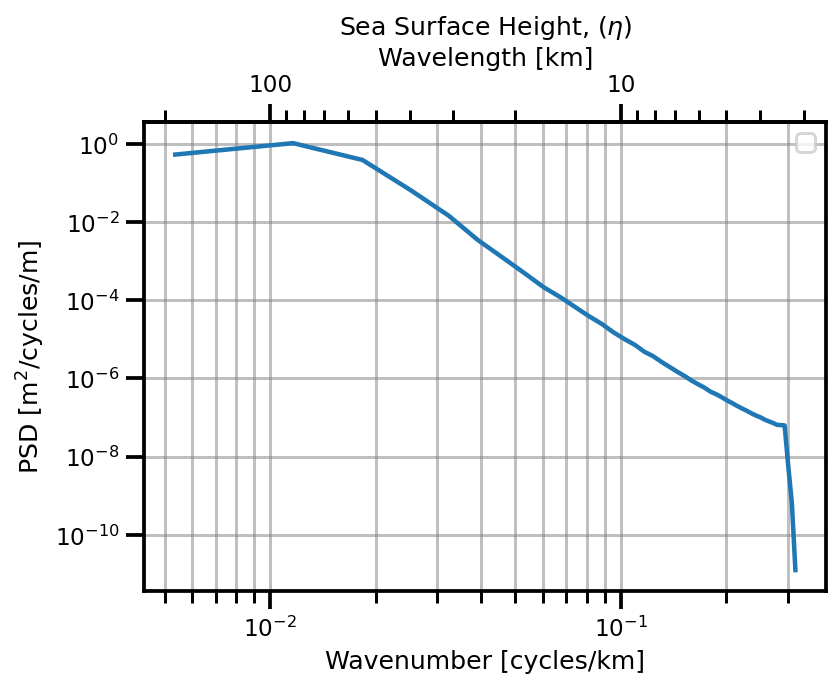

In [24]:


fig, ax = psd_plots.plot_psd(ds_psd_ssh_scaled, 1e3)
ax.set_title(r"Sea Surface Height (Scaled), ($\eta$)")
fig.set(size_inches=(6,5))
plt.tight_layout()
plt.show()


fig, ax = psd_plots.plot_psd(ds_psd_ssh, 1e3)
ax.set_title(r"Sea Surface Height, ($\eta$)")
fig.set(size_inches=(6,5))
plt.tight_layout()
plt.show()

In [25]:
# kinetic energy
ds_psd_ke = psd_transform.isotropic_power_spectrum(ds_var.ke)
# enstropy
ds_psd_enstropy = psd_transform.isotropic_power_spectrum(ds_var.enstrophy)

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
/var/folders/k9/_v6ywhvj0nq36tpttd3j4mq80000gn/T/ipykernel_64968/2198888350.py:5: UserWarning: Matplotlib is currently using agg, which is a non-GUI backend, so cannot show the figure.
  plt.show()


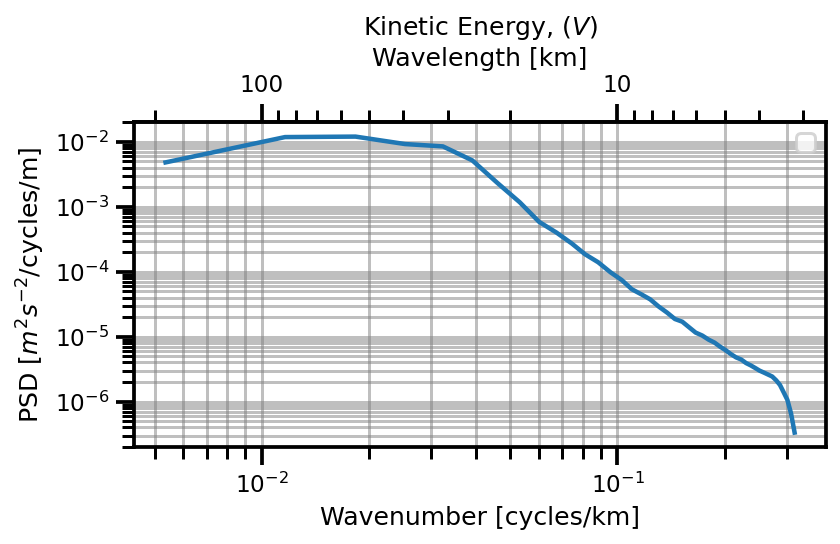

In [26]:
fig, ax = psd_plots.plot_psd(ds_psd_ke, 1e3)
ax.set_title(r"Kinetic Energy, ($V$)")
ax.set_ylabel(r"PSD [$m^2s^{-2}$/cycles/m]")
plt.tight_layout()
plt.show()

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
/var/folders/k9/_v6ywhvj0nq36tpttd3j4mq80000gn/T/ipykernel_64968/2590151875.py:5: UserWarning: Matplotlib is currently using agg, which is a non-GUI backend, so cannot show the figure.
  plt.show()


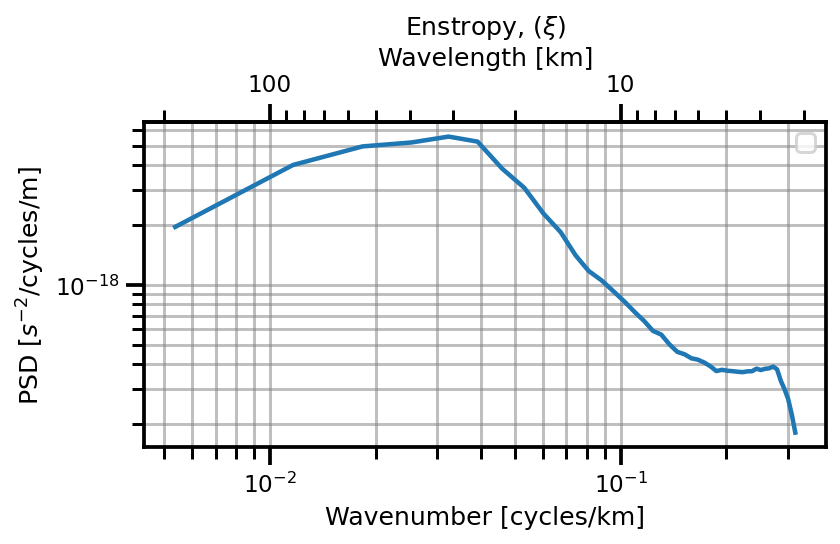

In [27]:
fig, ax = psd_plots.plot_psd(ds_psd_enstropy, 1e3)
ax.set_title(r"Enstropy, ($\xi$)")
ax.set_ylabel(r"PSD [$s^{-2}$/cycles/m]")
plt.tight_layout()
plt.show()

In [51]:
from pymap3d import enu2geodetic, geodetic2enu
lat, lon, alt = enu2geodetic(
    ds_var.lat, ds_var.lon, 0.0,
    23.0, 285.0-180.0, 0.0
)

In [49]:
lat.min(), lat.max(), lon.min(), lon.max(), alt.min(), alt.max()

(23.000000000000004,
 24.778226127947068,
 105.00000000000001,
 106.96067453302818,
 -71298.84961800827,
 76623.76091277543)

In [47]:
285.0-180

105.0

### Other Scale Transforms

#### Height

In [28]:
# time unit
unit_t = 60*60*24*5 # seconds (10 days)
# domain unit
unit_l = 100e3 # 100 km
# time unit
unit_h = convert_time_dist_2_height(time=unit_t, distance=unit_l, g=g, f=f)
print(unit_h, " m")
print(unit_h/1000, " km")
# print(unit_h-earth_radius, " m")
# print((unit_h-earth_radius)/1000, " km")

2270833333.3333335  m
2270833.3333333335  km


NameError: name 'earth_radius' is not defined

#### Distance

In [ ]:
# time unit
unit_t = 60*60*24*10 # seconds (10 days)
# domain unit
unit_h = 100e3 # meters
# time unit
unit_l = convert_time_height_2_dist(height=unit_h, time=unit_t, g=g, f=f)
print(unit_l, " m")
print(unit_l/1000, " km")

92064325.33831984  m
92064.32533831983  km
